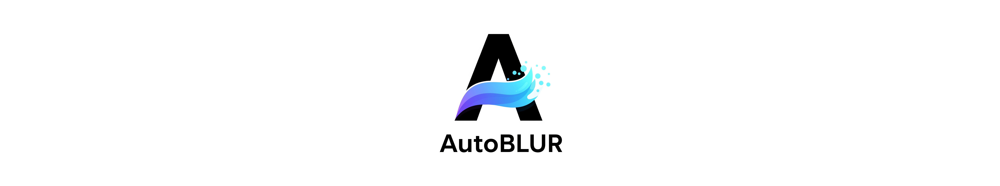

# AutoBLUR: Automated Brand Obfuscation Tool

AutoBLUR is an advanced tool designed to automate the process of removing identifiable brand elements from video content. It is particularly useful for market research and memorability testing, where unbiased recall of brand information is crucial.

## Key Features:
**1.  Automated Video Processing:**

*   Downloads and extracts video files from a specified URL.
*   Processes videos by blurring brand logos and text using computer vision techniques.

**2.  Dual Engine Capability:**

*   **EasyOCR**: Detects and blurs text within video frames.
*   **YOLO** (You Only Look Once): Identifies and blurs brand logos with high accuracy.

**3.  Customizable Confidence Level:**

*   Users can adjust the confidence threshold to control the sensitivity of text and logo detection.

**4.  Efficient Workflow:**

*   Processes each video frame-by-frame, applying blurring to detected regions.
*   Outputs processed videos to a designated directory, ensuring easy access and organization.

**5.  Robust Error Handling:**

*   Includes mechanisms to handle errors during video processing, ensuring smooth operation.

**6.  Model Integration:**

*   Utilizes a pre-trained YOLO model to enhance logo detection accuracy.
*   Automatically downloads the model if not present, simplifying setup.

## Usage:

AutoBLUR is ideal for researchers and analysts who need to strip branding from videos for unbiased testing. It automates the labor-intensive task of manual editing, enhancing efficiency and accuracy in market research scenarios.



---



The model was trained to recognize the following brand logos:

*   **Auto**: Acura, Audi, Chevy, Ford, Ford Mustang, Honda, Hyundai, Infiniti, Lexus, Nissan, Subaru, Toyota, Volkswagen
*   **Clothing**: Adidas
*   **Delivery**: Shipt
*   **Entertainment**: NBC, Paramount, Univision
*   **Finance**: American Express, Capital One, Chase, H&R Block, TurboTax
Food/Drink: MuscleMilk
*   **Gambling**: BetMGM, DraftKings, FanDuel
*   **Home**: Behr, Benjamin Moore, Lowe's
*   **Insurance**: Farmers, Liberty Mutual, State Farm
*   **Pharmaceuticals**: Pfizer, Prevnar, Dupixent
*   **Restaurant**: Burger King, Chick-fil-A, Domino's, KFC, Pizza Hut, Subway, Wendy's
*   **Retail**: Amazon, Macy's, Target, Walmart
*   **Telecom/Technology**: Apple, AT&T, Boost, Spectrum, T-Mobile, US Cellular, Verizon, Xfinity
*   **Travel**: Delta, Expedia

# Instructions
AutoBLUR is designed for ease of use:

1.  **Specify Video Location:**

*  Indicate where your MP4 files are stored. Test examples are available at /content/Videos/UnblurredVideos/.

2.  **Adjust Confidence Level:**

*  Set the confidence level slider. A higher value reduces false positives.

3.  **Run the Tool:**

*  Click the run button to start processing.

The processed videos will be saved in the `content/AutoBlurVideos/` folder, accessible on the left side of the notebook.



---


**Note**: For optimal performance, use a GPU. You can enable this by selecting "Runtime" > "Change runtime type" and choosing "T4 GPU".

In [1]:
#@title AutoBLUR: Video Text and Logo Obfuscation

# ========================
# Setup: Imports & Installs
# ========================

import os
import zipfile
import requests
import glob
import cv2
from IPython import display
from datetime import datetime

required_packages = ['supervision', 'ultralytics', 'easyocr', 'tqdm']
for package in required_packages:
    try:
        __import__(package)
    except ImportError:
        !pip install {package} --quiet
        display.clear_output()

from ultralytics import YOLO
import easyocr
from tqdm import tqdm
import supervision as sv

# ========================
# Download & Extract Video ZIP
# ========================

def download_and_extract(url, zip_path, extract_dir):
    try:
        response = requests.get(url)
        with open(zip_path, "wb") as f:
            f.write(response.content)
        os.makedirs(extract_dir, exist_ok=True)
        with zipfile.ZipFile(zip_path, "r") as zip_ref:
            zip_ref.extractall(extract_dir)
        os.remove(zip_path)
        print(f"[{datetime.now()}] Files extracted to {extract_dir}")
    except Exception as e:
        print(f"Error downloading or extracting files: {e}")

url = "https://0de6a5ef-8dc9-4736-a2b1-d6325e43d4f3.usrfiles.com/archives/0de6a5_d6bf7db3fbe34c31ba0bc2e0e259e0ba.zip"
zip_path = "Videos.zip"
extract_dir = "Videos"
download_and_extract(url, zip_path, extract_dir)

# ========================
# Parameters
# ========================

MP4_Folder = "/content/Videos/UnblurredVideos/"
ConfidenceLevel = 12 # @param {"type":"slider","min":0,"max":100,"step":1}
ConfidenceLevel = ConfidenceLevel / 100

Engine_easyOCR = True
Engine_YOLO_Only = True

output_directory = "/content/AutoBlurVideos/"
os.makedirs(output_directory, exist_ok=True)

# ========================
# Preferred Codec (H.264 with fallback)
# ========================

def get_codec():
    try:
        codec = cv2.VideoWriter_fourcc(*'avc1')
        test_writer = cv2.VideoWriter('/tmp/test.mp4', codec, 30, (640, 480))
        if not test_writer.isOpened():
            raise ValueError("avc1 codec not supported")
        test_writer.release()
        return codec
    except:
        print("[INFO] 'avc1' not supported, falling back to 'mp4v'")
        return cv2.VideoWriter_fourcc(*'mp4v')

codec = get_codec()

# ========================
# Load Models (Globally)
# ========================

MODEL_NAME = "brand_logo_model.pt"
MODEL_URL = "https://github.com/philip-hawkins-git/AutoBLUR/raw/1563b0e6e1509eb66a1277318fc3408dc1f50de0/2024-02-21_Brand_Logos_37_FINAL%20(mAP50%20844%20mAP95%20676).pt"
model_path = os.path.join("/content", MODEL_NAME)

if not os.path.exists(model_path):
    !wget "{MODEL_URL}" -O "{model_path}"

yolo_model = YOLO(model_path)
ocr_reader = easyocr.Reader(['en'])
ksize = (155, 155)

# ========================
# Utilities
# ========================

def blur_region_safe(frame, x1, y1, x2, y2, ksize=(155, 155)):
    h, w = frame.shape[:2]
    x1, y1 = max(0, x1), max(0, y1)
    x2, y2 = min(w, x2), min(h, y2)
    region = frame[y1:y2, x1:x2]
    if region.size > 0:
        frame[y1:y2, x1:x2] = cv2.GaussianBlur(region, ksize, 0)
    return frame

# ========================
# Detection Functions
# ========================

def process_video(video_path, output_path, detect_function):
    if not os.path.exists(video_path):
        print(f"Video file not found: {video_path}")
        return False

    try:
        cap = cv2.VideoCapture(video_path)
        width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        fps = cap.get(cv2.CAP_PROP_FPS)
        out = cv2.VideoWriter(output_path, codec, fps, (width, height))

        while True:
            ret, frame = cap.read()
            if not ret:
                break
            frame = detect_function(frame)
            out.write(frame)

        cap.release()
        out.release()
        print(f"[{datetime.now()}] Processed: {os.path.basename(video_path)}")
        return True

    except Exception as e:
        print(f"Error processing {video_path}: {str(e)}")
        if os.path.exists(output_path):
            os.remove(output_path)
        return False

def detect_text_and_logo(frame):
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    results = yolo_model.track(frame, persist=True, agnostic_nms=True, conf=ConfidenceLevel)[0]
    detections = sv.Detections.from_ultralytics(results)

    for x1, y1, x2, y2 in detections.xyxy:
        frame = blur_region_safe(frame, int(x1), int(y1), int(x2), int(y2), ksize)

    text_results = ocr_reader.readtext(gray, text_threshold=ConfidenceLevel)
    for bbox, _, _ in text_results:
        x1, y1 = int(bbox[0][0]), int(bbox[0][1])
        x2, y2 = int(bbox[2][0]), int(bbox[2][1])
        frame = blur_region_safe(frame, x1, y1, x2, y2, ksize)

    return frame

def detect_logo_only(frame):
    results = yolo_model.track(frame, persist=True, agnostic_nms=True, conf=ConfidenceLevel)[0]
    detections = sv.Detections.from_ultralytics(results)

    for x1, y1, x2, y2 in detections.xyxy:
        frame = blur_region_safe(frame, int(x1), int(y1), int(x2), int(y2), ksize)

    return frame

# ========================
# Process Videos
# ========================

video_files = glob.glob(os.path.join(MP4_Folder, '*.mp4'))

for video_file in tqdm(video_files, desc="Processing videos"):
    base = os.path.splitext(os.path.basename(video_file))[0]
    output_easyocr = os.path.join(output_directory, f"{base}_easyOCR.mp4")
    output_yolo = os.path.join(output_directory, f"{base}_YOLO.mp4")

    if os.path.exists(output_easyocr) or os.path.exists(output_yolo):
        print(f"Skipping {base}, already processed.")
        continue

    print(f"[{datetime.now()}] Starting {base}")

    success = False
    if Engine_easyOCR:
        success = process_video(video_file, output_easyocr, detect_text_and_logo)

    if not success and Engine_YOLO_Only:
        process_video(video_file, output_yolo, detect_logo_only)

print("✅ All videos processed.")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
[2025-05-22 19:32:52.246058] Files extracted to Videos
[INFO] 'avc1' not supported, falling back to 'mp4v'
--2025-05-22 19:32:52--  https://github.com/philip-hawkins-git/AutoBLUR/raw/1563b0e6e1509eb66a1277318fc3408dc1f50de0/2024-02-21_Brand_Logos_37_FINAL%20(mAP50%20844%20mAP95%20676).pt
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/philip-hawkins-git/AutoBLUR/1563b0e6e1509eb66a1277318fc3408dc1f50de0/2024-02-21_Brand_Logos_37_FINAL%20(mAP50%20844%20mAP95%20676).pt [following]
--2025-05-22 19:32:52--  https://raw.git

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Processing videos:   0%|          | 0/6 [00:00<?, ?it/s]

[2025-05-22 19:32:59.799671] Starting HyundaiTucson
requirements: Ultralytics requirement ['lap>=0.5.12'] not found, attempting AutoUpdate...

requirements: AutoUpdate success ✅ 0.7s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


0: 800x800 1 Hyundai, 23.2ms
Speed: 20.9ms preprocess, 23.2ms inference, 362.4ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 1 Hyundai, 16.1ms
Speed: 9.6ms preprocess, 16.1ms inference, 1.9ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 1 Hyundai, 16.0ms
Speed: 6.7ms preprocess, 16.0ms inference, 1.8ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 1 Hyundai, 13.2ms
Speed: 6.0ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 1 Hyundai, 12.8ms
Speed: 6.6ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 1 Hyundai, 1 Word, 12.4ms
Speed: 7.3ms preprocess, 12.4ms inference, 2.2ms postpr

Processing videos:  17%|█▋        | 1/6 [02:41<13:29, 161.92s/it]

[2025-05-22 19:35:41.717280] Processed: HyundaiTucson.mp4
[2025-05-22 19:35:41.718537] Starting NissanRogue

0: 800x640 1 Chevy, 46.8ms
Speed: 5.8ms preprocess, 46.8ms inference, 2.0ms postprocess per image at shape (1, 3, 800, 640)

0: 800x640 1 Chevy, 12.6ms
Speed: 5.7ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 800, 640)

0: 800x640 1 Chevy, 12.2ms
Speed: 6.2ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 800, 640)

0: 800x640 1 TMobile, 12.0ms
Speed: 5.4ms preprocess, 12.0ms inference, 2.4ms postprocess per image at shape (1, 3, 800, 640)

0: 800x640 (no detections), 12.0ms
Speed: 4.8ms preprocess, 12.0ms inference, 0.8ms postprocess per image at shape (1, 3, 800, 640)

0: 800x640 1 TMobile, 13.7ms
Speed: 5.7ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 800, 640)

0: 800x640 (no detections), 13.5ms
Speed: 6.8ms preprocess, 13.5ms inference, 0.8ms postprocess per image at shape (1, 3, 800, 64

Processing videos:  33%|███▎      | 2/6 [04:21<08:21, 125.30s/it]

[2025-05-22 19:37:21.386308] Processed: NissanRogue.mp4
[2025-05-22 19:37:21.387584] Starting ToyotaCamry

0: 800x800 1 Toyota, 1 Word, 12.4ms
Speed: 6.4ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 1 Toyota, 1 Word, 12.8ms
Speed: 5.7ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 1 Toyota, 1 Word, 13.5ms
Speed: 7.4ms preprocess, 13.5ms inference, 2.2ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 1 Toyota, 1 Word, 12.4ms
Speed: 6.4ms preprocess, 12.4ms inference, 1.7ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 1 Toyota, 1 Word, 12.7ms
Speed: 6.9ms preprocess, 12.7ms inference, 1.9ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 1 Toyota, 1 Word, 12.8ms
Speed: 7.2ms preprocess, 12.8ms inference, 1.9ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 1 Toyota, 1 Word, 13.2ms
Speed: 7.0ms preprocess, 13.2ms inference, 1.6ms post

Processing videos:  50%|█████     | 3/6 [05:02<04:20, 86.67s/it] 

[2025-05-22 19:38:02.087327] Processed: ToyotaCamry.mp4
[2025-05-22 19:38:02.088590] Starting 3M

0: 800x800 3 Words, 16.6ms
Speed: 14.4ms preprocess, 16.6ms inference, 2.5ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 3 Words, 17.2ms
Speed: 6.7ms preprocess, 17.2ms inference, 2.2ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 3 Words, 16.7ms
Speed: 6.2ms preprocess, 16.7ms inference, 2.4ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 5 Words, 16.2ms
Speed: 6.2ms preprocess, 16.2ms inference, 2.4ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 1 Line, 3 Words, 13.0ms
Speed: 7.2ms preprocess, 13.0ms inference, 1.5ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 1 Line, 3 Words, 13.0ms
Speed: 6.6ms preprocess, 13.0ms inference, 2.2ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 1 Line, 4 Words, 14.5ms
Speed: 7.2ms preprocess, 14.5ms inference, 2.1ms postprocess per image at shape (1, 3, 800, 800)

0:

Processing videos:  67%|██████▋   | 4/6 [05:27<02:04, 62.28s/it]

[2025-05-22 19:38:26.979727] Processed: 3M.mp4
[2025-05-22 19:38:26.981026] Starting NatureMadeCarTestimonial

0: 800x480 12 Lines, 37 Words, 7 Word_Stacks, 70.8ms
Speed: 4.6ms preprocess, 70.8ms inference, 2.3ms postprocess per image at shape (1, 3, 800, 480)

0: 800x480 5 Lines, 22 Words, 6 Word_Stacks, 14.6ms
Speed: 6.4ms preprocess, 14.6ms inference, 2.6ms postprocess per image at shape (1, 3, 800, 480)

0: 800x480 4 Lines, 25 Words, 6 Word_Stacks, 7.8ms
Speed: 4.6ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 800, 480)

0: 800x480 5 Lines, 23 Words, 6 Word_Stacks, 7.3ms
Speed: 7.3ms preprocess, 7.3ms inference, 2.3ms postprocess per image at shape (1, 3, 800, 480)

0: 800x480 6 Lines, 25 Words, 6 Word_Stacks, 7.5ms
Speed: 3.6ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 800, 480)

0: 800x480 5 Lines, 22 Words, 7 Word_Stacks, 8.8ms
Speed: 5.4ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 800, 48

Processing videos:  83%|████████▎ | 5/6 [07:34<01:25, 85.57s/it]

[2025-05-22 19:40:33.838477] Processed: NatureMadeCarTestimonial.mp4
[2025-05-22 19:40:33.839726] Starting FarmersDog

0: 800x480 1 Line, 1 Word, 9.9ms
Speed: 5.1ms preprocess, 9.9ms inference, 2.8ms postprocess per image at shape (1, 3, 800, 480)

0: 800x480 1 Line, 2 Words, 10.5ms
Speed: 6.2ms preprocess, 10.5ms inference, 2.1ms postprocess per image at shape (1, 3, 800, 480)

0: 800x480 1 Line, 2 Words, 7.6ms
Speed: 4.8ms preprocess, 7.6ms inference, 2.8ms postprocess per image at shape (1, 3, 800, 480)

0: 800x480 1 Line, 2 Words, 10.0ms
Speed: 7.7ms preprocess, 10.0ms inference, 1.7ms postprocess per image at shape (1, 3, 800, 480)

0: 800x480 1 Line, 2 Words, 11.6ms
Speed: 5.2ms preprocess, 11.6ms inference, 4.1ms postprocess per image at shape (1, 3, 800, 480)

0: 800x480 1 Line, 3 Words, 8.1ms
Speed: 7.6ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 800, 480)

0: 800x480 1 Line, 3 Words, 9.8ms
Speed: 5.7ms preprocess, 9.8ms inference, 3.2ms postproc

Processing videos: 100%|██████████| 6/6 [09:19<00:00, 93.23s/it]

[2025-05-22 19:42:19.202502] Processed: FarmersDog.mp4
✅ All videos processed.


# Examples


---



## Example 1: 3M

In [2]:
#@title 3M (Before)

from IPython.display import HTML
from base64 import b64encode

def display_video(video_path, width=640):
    # Read the video file and encode it in base64
    video_file = open(video_path, "rb").read()
    video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"

    # Display the video
    return HTML(f"""
        <video width="{width}" controls>
            <source src="{video_url}" type="video/mp4">
        </video>
    """)

# Display the video
display_video('/content/Videos/UnblurredVideos/3M.mp4')


In [3]:
#@title 3M (After)

!ffmpeg -i /content/AutoBlurVideos/3M_easyOCR.mp4 -vcodec libx264 -acodec aac /content/AutoBlurVideos/3M_easyOCR_reencoded.mp4
display.clear_output()

# Display the video
display_video('/content/AutoBlurVideos/3M_easyOCR_reencoded.mp4')

## Example 2: The Farmer's Dog

In [4]:
#@title The Farmer's Dog (Before)

# Display the video
display_video('/content/Videos/UnblurredVideos/FarmersDog.mp4')

In [5]:
#@title The Farmer's Dog (After)

!ffmpeg -i /content/AutoBlurVideos/FarmersDog_easyOCR.mp4 -vcodec libx264 -acodec aac /content/AutoBlurVideos/FarmersDog_easyOCR_reencoded.mp4
display.clear_output()

# Display the video
display_video('/content/AutoBlurVideos/FarmersDog_easyOCR_reencoded.mp4')

## Example 3: Hyundai Tucson

In [6]:
#@title Hyundai Tucson (Before)

# Display the video
display_video('/content/Videos/UnblurredVideos/HyundaiTucson.mp4')

In [7]:
#@title Hyundai Tucson (After)

!ffmpeg -i /content/AutoBlurVideos/HyundaiTucson_easyOCR.mp4 -vcodec libx264 -acodec aac /content/AutoBlurVideos/HyundaiTucson_easyOCR_reencoded.mp4
display.clear_output()

# Display the video
display_video('/content/AutoBlurVideos/HyundaiTucson_easyOCR_reencoded.mp4')

## Example 4: Nature Made Vitamins

In [8]:
#@title Nature Made (Before)

# Display the video
display_video('/content/Videos/UnblurredVideos/NatureMadeCarTestimonial.mp4')

In [9]:
#@title Nature Made (After)

!ffmpeg -i /content/AutoBlurVideos/NatureMadeCarTestimonial_easyOCR.mp4 -vcodec libx264 -acodec aac /content/AutoBlurVideos/NatureMadeCarTestimonial_easyOCR_reencoded.mp4
display.clear_output()

# Display the video
display_video('/content/AutoBlurVideos/NatureMadeCarTestimonial_easyOCR_reencoded.mp4')

## Example 5: Nissan Rogue

In [10]:
#@title Nissan Rogue (Before)

# Display the video
display_video('/content/Videos/UnblurredVideos/NissanRogue.mp4')

In [11]:
#@title Nissan Rogue (After)

!ffmpeg -i /content/AutoBlurVideos/NissanRogue_easyOCR.mp4 -vcodec libx264 -acodec aac /content/AutoBlurVideos/NissanRogue_easyOCR_reencoded.mp4
display.clear_output()

# Display the video
display_video('/content/AutoBlurVideos/NissanRogue_easyOCR_reencoded.mp4')

## Example 6: Toyota Camry

In [12]:
#@title Toyota Camry (Before)

# Display the video
display_video('/content/Videos/UnblurredVideos/ToyotaCamry.mp4')

In [13]:
#@title Toyota Camry (After)

!ffmpeg -i /content/AutoBlurVideos/ToyotaCamry_easyOCR.mp4 -vcodec libx264 -acodec aac /content/AutoBlurVideos/ToyotaCamry_easyOCR_reencoded.mp4
display.clear_output()

# Display the video
display_video('/content/AutoBlurVideos/ToyotaCamry_easyOCR_reencoded.mp4')